CSC-5610-301: AI Tools and Paradigms
Project #6: Baseball Hall of Fame Prediction
Data Cleaning
12.7.2024
Benjamin F. Shaske

Workstream for the final project is to create a cleaned data set for the modeling. 20 data files were analyzed and used to create a single clean .csv for the final project.

Import all relative libraries for data cleaning.

In [1]:
import kagglehub
import pandas as pd
import os
from functools import reduce

c:\Users\bshaske\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Import the latest wupdated versions of all .csv files from Kaggle Hub.

In [2]:
# Download latest version
path = kagglehub.dataset_download("open-source-sports/baseball-databank")

print("Path to dataset files:", path)

csv_files = [f for f in os.listdir(path) if f.endswith('.csv')]


Path to dataset files: C:\Users\bshaske\.cache\kagglehub\datasets\open-source-sports\baseball-databank\versions\2


About Dataset
Baseball Databank is a compilation of historical baseball data in a
convenient, tidy format, distributed under Open Data terms.

This version of the Baseball databank was downloaded from Sean Lahman's website.

Note that as of v1, this dataset is missing a few tables because of a restriction on the number of individual files that can be added. This is in the process of being fixed. The missing tables are Parks, HomeGames, CollegePlaying, Schools, Appearances, and FieldingPost.

The Data
The design follows these general principles. Each player is assigned a
unique number (playerID). All of the information relating to that player
is tagged with his playerID. The playerIDs are linked to names and
birthdates in the MASTER table.

The database is comprised of the following main tables:

MASTER - Player names, DOB, and biographical info
Batting - batting statistics
Pitching - pitching statistics
Fielding - fielding statistics
It is supplemented by these tables:

AllStarFull - All-Star appearances
HallofFame - Hall of Fame voting data
Managers - managerial statistics
Teams - yearly stats and standings
BattingPost - post-season batting statistics
PitchingPost - post-season pitching statistics
TeamFranchises - franchise information
FieldingOF - outfield position data
FieldingPost- post-season fielding data
ManagersHalf - split season data for managers
TeamsHalf - split season data for teams
Salaries - player salary data
SeriesPost - post-season series information
AwardsManagers - awards won by managers
AwardsPlayers - awards won by players
AwardsShareManagers - award voting for manager awards
AwardsSharePlayers - award voting for player awards
Appearances - details on the positions a player appeared at
Schools - list of colleges that players attended
CollegePlaying - list of players and the colleges they attended
Descriptions of each of these tables can be found attached to their associated files, below.

Acknowledgments
This work is licensed under a Creative Commons Attribution-ShareAlike
3.0 Unported License. For details see:
http://creativecommons.org/licenses/by-sa/3.0/

Person identification and demographics data are provided by
Chadwick Baseball Bureau (http://www.chadwick-bureau.com),
from its Register of baseball personnel.

Player performance data for 1871 through 2014 is based on the
Lahman Baseball Database, version 2015-01-24, which is
Copyright (C) 1996-2015 by Sean Lahman.

The tables Parks.csv and HomeGames.csv are based on the game logs
and park code table published by Retrosheet.
This information is available free of charge from and is copyrighted
by Retrosheet. Interested parties may contact Retrosheet at
http://www.retrosheet.org.

Load independent data frames. Title them so they are easy to use by the team. Descriptions of key column data.

In [3]:
# Data with PlayerID
AllstarFull_df = pd.read_csv(os.path.join(path, 'AllstarFull.csv'))
AllstarFull_df.info()

AwardsManagers_df = pd.read_csv(os.path.join(path, 'AwardsManagers.csv'))
AwardsManagers_df.info()

AwardsPlayers_df = pd.read_csv(os.path.join(path, 'AwardsPlayers.csv'))
AwardsPlayers_df.info()

AwardsShareManagers_df = pd.read_csv(os.path.join(path, 'AwardsShareManagers.csv'))
AwardsShareManagers_df.info()

AwardsSharePlayers_df = pd.read_csv(os.path.join(path, 'AwardsSharePlayers.csv')) 
AwardsSharePlayers_df.info()

Batting_df = pd.read_csv(os.path.join(path, 'Batting.csv')) # Priamary Data Set
Batting_df.info()

BattingPost_df = pd.read_csv(os.path.join(path, 'BattingPost.csv')) # Priamary Data Set
BattingPost_df.info()

Fielding_df = pd.read_csv(os.path.join(path, 'Fielding.csv'))
Fielding_df.info()

FieldingOF_df = pd.read_csv(os.path.join(path, 'FieldingOF.csv'))
FieldingOF_df.info()

HallOfFame_df = pd.read_csv(os.path.join(path, 'HallOfFame.csv')) # Priamary Data Set
HallOfFame_df.info()

Managers_df = pd.read_csv(os.path.join(path, 'Managers.csv'))
Managers_df.info()

ManagersHalf_df = pd.read_csv(os.path.join(path, 'ManagersHalf.csv'))  
ManagersHalf_df.info()

Master_df = pd.read_csv(os.path.join(path, 'Master.csv'))
Master_df.info()

Pitching_df = pd.read_csv(os.path.join(path, 'Pitching.csv'))
Pitching_df.info()

PitchingPost_df = pd.read_csv(os.path.join(path, 'PitchingPost.csv'))
PitchingPost_df.info()

Salaries_df = pd.read_csv(os.path.join(path, 'Salaries.csv'))
Salaries_df.info()

# Data with no Player ID
SeriesPost_df = pd.read_csv(os.path.join(path, 'SeriesPost.csv'))
print('\nAbout this file: SeriesPost_df\nyearID: Year\nround: Playoff round\nteamIDwinner: Team ID of the winner\nlgIDwinner: League ID of the winner\nteamIDloser: Team ID of the loser'\
    'lgIDloser: League ID of the loser\nwins: Wins by the winner\nlosses: Losses by the loser\nties: Tie games\n\nSeriesPost_df:')
SeriesPost_df.info()

Teams_df = pd.read_csv(os.path.join(path, 'Teams.csv'))
print('\nAbout this file: Teams_df\nyearID: Year\nlgID: League\nteamID: Team\nfranchID: Franchise (links to TeamsFranchise table)\ndivID: Team\'s division\nRank: Position in final standings'\
    'G: Games played\nGhome: Games played at home\nW: Wins\nL: Losses\nDivWin: Division Winner (Y or N)\nWCWin: Wild Card Winner (Y or N)\nLgWin: League Champion (Y or N)'\
        'WSWin: World Series Winner (Y or N)\nR: Runs scored\nAB: At Bats\nH: Hits by batters\n2B: Doubles\n3B: Triples\nHR: Homeruns by batters\nBB: Walks by batters\nSO: Strikeouts by batters'\
            'SB: Stolen Bases\nCS: Caught stealing\nHBP: Hit by pitch\nSF: Sacrifice flies\nRA: Opponents runs scored\nER: Earned Runs\nERA: Earned Run Average\nCG: Complete Games'\
                'SHO: Shutouts\nSV: Saves\nIPouts: Outs Pitched (innings pitched x 3)\nHA: Hits allowed\nHRA: Homeruns allowed\nBBA: Walks allowed\nSOA: Strikeouts by pitchers\nE: Errors\nDP: Double Plays'\
                    'FP: Fielding Percentage\nname: Team Name\npark: Name of team\'s home ballpark\nattendance: Home attendance total\nBPF: Three-year park factor for batters\nPPF: Three-year park factor for pitchers'\
                        'teamIDBR: Team ID used by Baseball Reference website\nteamIDlahman45: Team ID used in Lahman database version 4.5\nteamIDretro: Team ID used by Retrosheet\n\nTeams_df:')
Teams_df.info()

TeamsFranchises_df = pd.read_csv(os.path.join(path, 'TeamsFranchises.csv'))
print('\nAbout this file: TeamsFranchises_df\nfranchID: Franchise ID\nfranchName: Franchise name\nactive: Whether team is currently active (Y or N)\nNAassoc: Association with National Association'\
    'NAassoc: Association with National Association\n\nTeamsFranchises_df:')
TeamsFranchises_df.info()

TeamsHalf_df = pd.read_csv(os.path.join(path, 'TeamsHalf.csv'))
print('\nAbout this file: TeamsHalf_df\nyearID: Year\nlgID: League\nteamID: Team\nHalf: Half season indicator (1 or 2)\ndivID: Team\'s division\nDivWin: Division Winner (Y or N)\nRank: Position in final standings'\
    'G: Games played\nW: Wins\nL: Losses\nDivWin: Division Winner (Y or N)\nWCWin: Wild Card Winner (Y or N)\nLgWin: League Champion (Y or N)\nWSWin: World Series Winner (Y or N)'\
        'R: Runs scored\nAB: At Bats\nH: Hits by batters\n2B: Doubles\n3B: Triples\nHR: Homeruns by batters\nBB: Walks by batters\nSO: Strikeouts by batters\nSB: Stolen Bases'\
            'CS: Caught stealing\nHBP: Hit by pitch\nSF: Sacrifice flies\nRA: Opponents runs scored\nER: Earned Runs\nERA: Earned Run Average\nCG: Complete Games\nSHO: Shutouts'\
                'SV: Saves\nIPouts: Outs Pitched (innings pitched x 3)\nHA: Hits allowed\nHRA: Homeruns allowed\nBBA: Walks allowed\nSOA: Strikeouts by pitchers\nE: Errors\nDP: Double Plays'\
                    'FP: Fielding Percentage\nname: Team Name\npark: Name of team\'s home ballpark\nattendance: Home attendance total\nBPF: Three-year park factor for batters\nPPF: Three-year park factor for pitchers'\
                        'teamIDBR: Team ID used by Baseball Reference website\nteamIDlahman45: Team ID used in Lahman database version 4.5\nteamIDretro: Team ID used by Retrosheet\n\nTeamsHalf_df:')
TeamsHalf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5069 entries, 0 to 5068
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   playerID     5069 non-null   object 
 1   yearID       5069 non-null   int64  
 2   gameNum      5069 non-null   int64  
 3   gameID       5020 non-null   object 
 4   teamID       5069 non-null   object 
 5   lgID         5069 non-null   object 
 6   GP           5050 non-null   float64
 7   startingPos  1580 non-null   float64
dtypes: float64(2), int64(2), object(4)
memory usage: 316.9+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  177 non-null    object 
 1   awardID   177 non-null    object 
 2   yearID    177 non-null    int64  
 3   lgID      177 non-null    object 
 4   tie       2 non-null      object 
 5   notes     0 non-null      fl

#Cleaning the data
##Cleaning Functions: 
create code for repetitive cleaning functions throughout data set.

In [ ]:
def delete_column(df, column_name):
    """Deletes a specified column from a DataFrame."""
    # Check if the column exists in the DataFrame, error handling to verify proper column name.
    if column_name in df.columns:
        df = df.drop(columns=[column_name])
        print(f"Column '{column_name}' deleted.")
    else:
        print(f"Column '{column_name}' ?")
    return df

def delete_rows_with_nulls(df):
    """Deletes rows from a DataFrame that contain any null (NaN) values."""
    # Drop rows with any null values
    df_cleaned = df.dropna()
    print(f"{len(df) - len(df_cleaned)} rows containing null values were deleted.")
    return df_cleaned

def replace_nan(df, value):
    """Replaces all NaN values in a DataFrame with a specified value."""
    # Replace NaN values
    df_replaced = df.fillna(value)
    print(f"All NaN values have been replaced with '{value}'.")
    return df_replaced

def append_missing_values(source_list, target_list):
    """Appends values from the source list to the target list if they are not already in the target list."""
    for value in source_list:
        if value not in target_list:
            target_list.append(value)
    return target_list

def rename_columns_with_prefix_except_playerID(df, df_name):
    """Renames all column headers with prefix, except for 'playerID'"""
    df = df.rename(columns=lambda col: f"{df_name}_{col}" if col != 'playerID' else col)
    return df

def rename_items_with_list_name_except_playerID(columns, list_name):
    """Renames items in a list by adding the list name as a prefix except for the item 'playerID'."""
    renamed_columns = [f"{list_name}_{col}" if col != 'playerID' else col for col in columns]
    return renamed_columns

def join_two_dataframes_by_playerID(df1, df2, how='inner'):
    """Joins two DataFrames on the unique identifier 'playerID'."""
    # Ensure both DataFrames have 'playerID' as a column
    if 'playerID' not in df1.columns or 'playerID' not in df2.columns:
        raise ValueError("Both DataFrames must have a 'playerID' column.")
    
    # Perform the join using the pandas merge function
    joined_df = pd.merge(df1, df2, on='playerID', how=how)
    
    return joined_df

def optimize_memory(df):
    """Optimizes memory usage of a DataFrame by converting data types."""
    for col in df.select_dtypes(include=['float64']).columns:
        df[col] = df[col].astype('float16')
    for col in df.select_dtypes(include=['int64']).columns:
        df[col] = df[col].astype('int16')
    return df

def merge_dataframes_by_playerID(dataframes, how='inner'):
    """Merges a list of DataFrames on the unique identifier 'playerID'."""
    if not dataframes:
        raise ValueError("The list of DataFrames is empty.")
    
    # Are they DF(s)?
    for i, df in enumerate(dataframes):
        if not isinstance(df, pd.DataFrame):
            raise TypeError(f"{i} not DataFrame. Got {type(df)}")
        if 'playerID' not in df.columns:
            raise ValueError(f"{i} no 'playerID' column.")
    
    # Use functools.reduce to iteratively merge the DataFrames
    merged_df = reduce(lambda left, right: pd.merge(left, right, on='playerID', how=how), dataframes)
    
    return merged_df

##Cleaning Variables used to track type and prep for joining.

In [5]:
cleaned_categorical = [] # List to store cleaned categorical columns
cleaned_numerical_int = [] # List to store cleaned numerical (integer) columns
cleaned_numerical_float = [] # List to store cleaned numerical (float) columns
cleaned_boolean = [] # List to store cleaned boolean columns
cleaned_dataframes = [] # List to store cleaned DataFrames
cleaned_date = [] # List to store cleaned date columns

Determine the primary combined data set. (clean before joining?). Key unique ID should be the player ID. Data Frames to be combined using the ID.
16/20 potential data sets contain player ID.- Create a list for additional referencing.

Data with no player ID will not be used for the primary calculations

In [6]:
# Data sets containing player IDs
df_initial =[]
df_with_playerID = []
df_initial_additional = []

##Cleaning the AllstarFull_df. 
Categorical variables: {Player ID, yearID, gameID, teamID, lgID, startingPos}
NOTE: Starting position has many null values; consider removing from cleaned data set. non starters DH, bench players, could just change to 0 equating non starter.
Numerical variables: {game number, games played}
Consider changing position to categorical respective position (Is this even necessary?)

In [7]:
print('\nAbout this file: AllstarFull_df\nplayerID: Player ID code\nYearID: Year\ngameNum: Game number (zero if only one All-Star game played that season)'\
    '\ngameID: Retrosheet ID for the game idea\nteamID: Team\nlgID: League\nGP: 1 if Played in the game\nstartingPos: If player was game starter, the position played\n\nAllstarFull_df:')
print(f"{AllstarFull_df.head()}\n")
AllstarFull_df.info()

# Consolodate Variables
AllstarFull_df_cat = ['playerID', 'yearID', 'gameID', 'teamID', 'lgID', 'startingPos']
AllstarFull_df_cat_renamed = rename_items_with_list_name_except_playerID(AllstarFull_df_cat, 'AllstarFull_df')   
append_missing_values(AllstarFull_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

AllstarFull_df_num_int = ['gameNum']
AllstarFull_df_num_int_renamed = rename_items_with_list_name_except_playerID(AllstarFull_df_num_int, 'AllstarFull_df')
append_missing_values(AllstarFull_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

AllstarFull_df_num_float = ['GP']
AllstarFull_df_num_float_renamed = rename_items_with_list_name_except_playerID(AllstarFull_df_num_float, 'AllstarFull_df')
append_missing_values(AllstarFull_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")\
    
#Rename columns and append to df_with_playerID
AllstarFull_df = rename_columns_with_prefix_except_playerID(AllstarFull_df, 'AllstarFull_df')
print(f"Renamed Columns:\n{AllstarFull_df.columns}")

FilteredAllstarFull_df = AllstarFull_df[['playerID', 'AllstarFull_df_yearID']]

#Cretae a list of dataframes
df_with_playerID.append(AllstarFull_df)
#df_initial.append(AllstarFull_df)
df_initial_additional.append(FilteredAllstarFull_df)



About this file: AllstarFull_df
playerID: Player ID code
YearID: Year
gameNum: Game number (zero if only one All-Star game played that season)
gameID: Retrosheet ID for the game idea
teamID: Team
lgID: League
GP: 1 if Played in the game
startingPos: If player was game starter, the position played

AllstarFull_df:
    playerID  yearID  gameNum        gameID teamID lgID   GP  startingPos
0  gomezle01    1933        0  ALS193307060    NYA   AL  1.0          1.0
1  ferreri01    1933        0  ALS193307060    BOS   AL  1.0          2.0
2  gehrilo01    1933        0  ALS193307060    NYA   AL  1.0          3.0
3  gehrich01    1933        0  ALS193307060    DET   AL  1.0          4.0
4  dykesji01    1933        0  ALS193307060    CHA   AL  1.0          5.0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5069 entries, 0 to 5068
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   playerID     5069 non-null   object 
 1   ye

##Cleaning the AwardsMangers_df.
Consider notes columns.
Key question swould be to identify if a former player becoming a manager and is found in the awards impacts the likelyhood of Hall of Fame induction.
Categorical variables: {PlayerID, Award ID, YearID, lgID}
Boolean variables: {tie}

In [8]:
print('\nAbout this file: AwardsManagers_df\nplayerID: Manager ID code\nawardID: Name of award won\nyearID: Year\nlgID: League\ntie: Award was a tie (Y or N)'\
    '\nnotes: Notes about the award\n\nAwardsManagers_df:')
print(f"{AwardsManagers_df.head()}\n") 
print(AwardsManagers_df.info())

# Delete the notes column due to redundant informations
AwardsManagers_df = delete_column(AwardsManagers_df, 'notes')

# Consolodate Variables
AwardsManagers_df_cat = ['playerID', 'awardID', 'yearID', 'lgID']
AwardsManagers_df_cat_renamed = rename_items_with_list_name_except_playerID(AwardsManagers_df_cat, 'AwardsManagers_df')
append_missing_values(AwardsManagers_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

AwardsManagers_df_bool = ['tie']
AwardsManagers_df_bool_renamed = rename_items_with_list_name_except_playerID(AwardsManagers_df_bool, 'AwardsManagers_df')
append_missing_values(AwardsManagers_df_bool_renamed, cleaned_boolean)
print(f"Cleaned Boolean Variables:\n{cleaned_boolean}")

#Rename columns and append to df_with_playerID
AwardsManagers_df = rename_columns_with_prefix_except_playerID(AwardsManagers_df, 'AwardsManagers_df')
print(f"Renamed Columns:\n{AwardsManagers_df.columns}\n")

FilteredAwardManagers_df = AwardsManagers_df[['playerID', 'AwardsManagers_df_yearID']]  

#Cretae a list of dataframes
df_with_playerID.append(AwardsManagers_df)
#df_initial_additional.append(FilteredAwardManagers_df)



About this file: AwardsManagers_df
playerID: Manager ID code
awardID: Name of award won
yearID: Year
lgID: League
tie: Award was a tie (Y or N)
notes: Notes about the award

AwardsManagers_df:
    playerID                    awardID  yearID lgID  tie  notes
0  larusto01  BBWAA Manager of the year    1983   AL  NaN    NaN
1  lasorto01  BBWAA Manager of the year    1983   NL  NaN    NaN
2  andersp01  BBWAA Manager of the year    1984   AL  NaN    NaN
3   freyji99  BBWAA Manager of the year    1984   NL  NaN    NaN
4    coxbo01  BBWAA Manager of the year    1985   AL  NaN    NaN

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  177 non-null    object 
 1   awardID   177 non-null    object 
 2   yearID    177 non-null    int64  
 3   lgID      177 non-null    object 
 4   tie       2 non-null      object 
 5   notes     0 non-null      float64

##Cleaning the AwardsPlayers_df
Same as the AwardsManagert_df.
Eliminate the notes column (most notes indicate position played, this should be found in the general dataset and might be excessive). 
(Note: significantly less null entries; however, not easy to parse for the scope of this project)


In [9]:
print('\nAbout this file: AwardsPlayers_df\nplayerID: Player ID code\nawardID: Name of award won\nyearID: Year\nlgID: League\ntie: Award was a tie (Y or N)'\
    '\nnotes: Notes about the award\n\nAwardsPlayers_df:')
print(f"{AwardsPlayers_df.head()}\n") 
print(AwardsPlayers_df.info())
print(AwardsPlayers_df.notes.unique())

# Delete the notes column due to redundant informations
AwardsPlayers_df = delete_column(AwardsPlayers_df, 'notes')

# Consolodate Variables
AwardsPlayers_df_cat = ['playerID', 'awardID', 'yearID', 'lgID']
AwardsPlayers_df_cat_renamed = rename_items_with_list_name_except_playerID(AwardsPlayers_df_cat, 'AwardsPlayers_df')
append_missing_values(AwardsPlayers_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

AwardsPlayers_df_bool = ['tie']
AwardsPlayers_df_bool_renamed = rename_items_with_list_name_except_playerID(AwardsPlayers_df_bool, 'AwardsPlayers_df')
append_missing_values(AwardsPlayers_df_bool_renamed, cleaned_boolean)
print(f"Cleaned Boolean Variables:\n{cleaned_boolean}")

#Rename columns and append to df_with_playerID
AwardsPlayers_df = rename_columns_with_prefix_except_playerID(AwardsPlayers_df, 'AwardsPlayers_df')
print(f"Renamed Columns:\n{AwardsPlayers_df.columns}\n")

FilteredAwardsPlayers_df = AwardsPlayers_df[['playerID', 'AwardsPlayers_df_yearID']]

#Cretae a list of dataframes
df_with_playerID.append(AwardsPlayers_df)
#df_initial.append(AwardsPlayers_df)
df_initial_additional.append(FilteredAwardsPlayers_df)


About this file: AwardsPlayers_df
playerID: Player ID code
awardID: Name of award won
yearID: Year
lgID: League
tie: Award was a tie (Y or N)
notes: Notes about the award

AwardsPlayers_df:
    playerID                awardID  yearID lgID  tie notes
0   bondto01  Pitching Triple Crown    1877   NL  NaN   NaN
1  hinespa01           Triple Crown    1878   NL  NaN   NaN
2  heckegu01  Pitching Triple Crown    1884   AA  NaN   NaN
3  radboch01  Pitching Triple Crown    1884   NL  NaN   NaN
4  oneilti01           Triple Crown    1887   AA  NaN   NaN

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6078 entries, 0 to 6077
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   playerID  6078 non-null   object
 1   awardID   6078 non-null   object
 2   yearID    6078 non-null   int64 
 3   lgID      6078 non-null   object
 4   tie       45 non-null     object
 5   notes     4648 non-null   object
dtypes: int64(1), object(5)
memory usa

##Clean the AwardsShareManagers_df
No null data. 
Categorical variables: {awardID, yearID, lgID, playerID}
Numerical variables: {pointsWon, PointsMax, votesFirst}

In [10]:
print('\nAbout this file: AwardsShareManagers_df\nawardID: Name of award won\nyearID: Year\nlgID: League\nplayerID: Manager ID code\npointsWon: Number of points won'\
    '\npointsMax: Maximum number of points possible\nvotesFirst: Number of first place votes\n\nAwardsShareManagers_df:')
print(f"{AwardsShareManagers_df.head()}\n")
print(AwardsShareManagers_df.info())

# Consolodate Variables
AwardsShareManagers_df_cat = ['awardID', 'yearID', 'lgID', 'playerID']
AwardsShareManagers_df_cat_renamed = rename_items_with_list_name_except_playerID(AwardsShareManagers_df_cat, 'AwardsShareManagers_df')
append_missing_values(AwardsShareManagers_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

AwardsShareManagers_df_num_int = ['pointsWon', 'pointsMax', 'votesFirst']
AwardsManagers_df_num_int_renamed = rename_items_with_list_name_except_playerID(AwardsShareManagers_df_num_int, 'AwardsShareManagers_df')
append_missing_values(AwardsManagers_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

#Rename columns and append to df_with_playerID
AwardsShareManagers_df = rename_columns_with_prefix_except_playerID(AwardsShareManagers_df, 'AwardsShareManagers_df')
print(f"Renamed Columns:\n{AwardsShareManagers_df.columns}\n")

FilteredAwardsShareManagers_df = AwardsShareManagers_df[['playerID', 'AwardsShareManagers_df_yearID']]

#Cretae a list of dataframes
df_with_playerID.append(AwardsShareManagers_df)
#df_initial_additional.append(FilteredAwardsShareManagers_df)



About this file: AwardsShareManagers_df
awardID: Name of award won
yearID: Year
lgID: League
playerID: Manager ID code
pointsWon: Number of points won
pointsMax: Maximum number of points possible
votesFirst: Number of first place votes

AwardsShareManagers_df:
           awardID  yearID lgID   playerID  pointsWon  pointsMax  votesFirst
0  Mgr of the year    1983   AL  altobjo01          7         28           7
1  Mgr of the year    1983   AL    coxbo01          4         28           4
2  Mgr of the year    1983   AL  larusto01         17         28          17
3  Mgr of the year    1983   NL  lasorto01         10         24          10
4  Mgr of the year    1983   NL  lillibo01          9         24           9

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   awardID     414 non-null    object
 1   yearID      414 non-null    int64 
 2   lgID  

##Clean the AwardsSharePlayers_df
Consider changing the null votesFirst to 0. (might consider the value of this column for this project)
All other data contains no null values.
Categorical variables: {awardID, yearID, lgID, playerID}
Numerical variables: {pointsWon, pointsMax, and votesFirst}

In [11]:
print('\nAbout this file: AwardsSharePlayers_df\nawardID: Name of award won\nyearID: Year\nlgID: League\nplayerID: Player ID code\npointsWon: Number of points won'\
    '\npointsMax: Maximum number of points possible\nvotesFirst: Number of first place votes\n\nAwardsSharePlayers_df:')  
print(f"{AwardsSharePlayers_df.head()}\n")
print(AwardsSharePlayers_df.info())

#consolodate variables
AwardsSharePlayers_df_cat = ['awardID', 'yearID', 'lgID', 'playerID']
AwardsSharePlayers_df_cat_renamed = rename_items_with_list_name_except_playerID(AwardsSharePlayers_df_cat, 'AwardsSharePlayers_df')
append_missing_values(AwardsSharePlayers_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

AwardsSharePlayers_df_num_int = ['pointsWon', 'pointsMax', 'votesFirst']
AwardsSharePlayers_df_num_int_renamed = rename_items_with_list_name_except_playerID(AwardsSharePlayers_df_num_int, 'AwardsSharePlayers_df')
append_missing_values(AwardsSharePlayers_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

#Rename columns and append to df_with_playerID
AwardsSharePlayers_df = rename_columns_with_prefix_except_playerID(AwardsSharePlayers_df, 'AwardsSharePlayers_df')
print(f"Renamed Columns:\n{AwardsSharePlayers_df.columns}\n")

FilteredAwardsSharePlayers_df = AwardsSharePlayers_df[['playerID', 'AwardsSharePlayers_df_yearID']]

#Cretae a list of dataframes
df_with_playerID.append(AwardsSharePlayers_df)
#df_initial.append(AwardsSharePlayers_df)
#df_initial_additional.append(FilteredAwardsSharePlayers_df)


About this file: AwardsSharePlayers_df
awardID: Name of award won
yearID: Year
lgID: League
playerID: Player ID code
pointsWon: Number of points won
pointsMax: Maximum number of points possible
votesFirst: Number of first place votes

AwardsSharePlayers_df:
    awardID  yearID lgID   playerID  pointsWon  pointsMax  votesFirst
0  Cy Young    1956   ML   fordwh01        1.0         16         1.0
1  Cy Young    1956   ML  maglisa01        4.0         16         4.0
2  Cy Young    1956   ML  newcodo01       10.0         16        10.0
3  Cy Young    1956   ML  spahnwa01        1.0         16         1.0
4  Cy Young    1957   ML  donovdi01        1.0         16         1.0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6795 entries, 0 to 6794
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   awardID     6795 non-null   object 
 1   yearID      6795 non-null   int64  
 2   lgID        6795 non-null   object 
 3   play

##Cleaning Batting_df
Categorical variables: {playerID, yearID, teamID, lgID}
All batting stats should be numerical. Note the use of FLOAT variables.

In [12]:
print('\nAbout this file: Batting_df\nplayerID: Player ID code\nyearID: Year\nstint: player\'s stint (order of appearances within a season)\nteamID: Team\nlgID: League'\
    '\nG: Games\nAB: At Bats\nR: Runs\nH: Hits\n2B: Doubles\n3B: Triples\nHR: Homeruns\nRBI: Runs Batted In\nSB: Stolen Bases\nCS: Caught stealing\nBB: Base on Balls'\
        '\nSO: Strikeouts\nIBB: Intentional walks\nHBP: Hit by pitch\nSH: Sacrifices\nSF: Sacrifice flies\nGIDP: Grounded into double plays\n\nBatting_df:')
print(f"{Batting_df.head()}\n")
print(Batting_df.info())
print(f"\nUnique Stint Values:\n {Batting_df.stint.unique()}")

#Consolodate Variables
Batting_df_cat = ['playerID', 'yearID', 'teamID', 'lgID']
Batting_df_cat_renamed = rename_items_with_list_name_except_playerID(Batting_df_cat, 'Batting_df')
append_missing_values(Batting_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

Batting_df_num_int = ['stint','G', 'AB', 'R', 'H', '2B', '3B', 'HR', 'RBI', 'SB', 'CS', 'BB', 'SO', 'IBB', 'HBP', 'SH', 'SF', 'GIDP']
Batting_df_num_int_renamed = rename_items_with_list_name_except_playerID(Batting_df_num_int, 'Batting_df')
append_missing_values(Batting_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

#Converting to int type for better memory usage.
#Batting_df_num_float = ['G', 'AB', 'R', 'H', '2B', '3B', 'HR', 'RBI', 'SB', 'CS', 'BB', 'SO', 'IBB', 'HBP', 'SH', 'SF', 'GIDP'] 
#Batting_df_num_float_renamed = rename_items_with_list_name_except_playerID(Batting_df_num_float, 'Batting_df')
#append_missing_values(Batting_df_num_float_renamed, cleaned_numerical_float)
#print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
Batting_df = rename_columns_with_prefix_except_playerID(Batting_df, 'Batting_df')
print(f"Renamed Columns:\n{Batting_df.columns}\n")

FilteredBatting_df = Batting_df

#Cretae a list of dataframes
df_with_playerID.append(Batting_df)
df_initial.append(Batting_df)
df_initial_additional.append(FilteredBatting_df)


About this file: Batting_df
playerID: Player ID code
yearID: Year
stint: player's stint (order of appearances within a season)
teamID: Team
lgID: League
G: Games
AB: At Bats
R: Runs
H: Hits
2B: Doubles
3B: Triples
HR: Homeruns
RBI: Runs Batted In
SB: Stolen Bases
CS: Caught stealing
BB: Base on Balls
SO: Strikeouts
IBB: Intentional walks
HBP: Hit by pitch
SH: Sacrifices
SF: Sacrifice flies
GIDP: Grounded into double plays

Batting_df:
    playerID  yearID  stint teamID lgID   G     AB     R     H    2B  ...  \
0  abercda01    1871      1    TRO  NaN   1    4.0   0.0   0.0   0.0  ...   
1   addybo01    1871      1    RC1  NaN  25  118.0  30.0  32.0   6.0  ...   
2  allisar01    1871      1    CL1  NaN  29  137.0  28.0  40.0   4.0  ...   
3  allisdo01    1871      1    WS3  NaN  27  133.0  28.0  44.0  10.0  ...   
4  ansonca01    1871      1    RC1  NaN  25  120.0  29.0  39.0  11.0  ...   

    RBI   SB   CS   BB   SO  IBB  HBP  SH  SF  GIDP  
0   0.0  0.0  0.0  0.0  0.0  NaN  NaN NaN N

##Cleaning BattingPost_df
Categorical variables: {yearID, playerID, team}

In [13]:
print('\nAbout this file: BattingPost_df\nplayerID: Player ID code\nyearID: Year\nround: Playoff round\nteamID: Team\nlgID: League\nG: Games\nAB: At Bats\nR: Runs'\
    'H: Hits\n2B: Doubles\n3B: Triples\nHR: Homeruns\nRBI: Runs Batted In\nSB: Stolen Bases\nCS: Caught stealing\nBB: Base on Balls\nSO: Strikeouts\nIBB: Intentional walks+'\
        'HBP: Hit by pitch\nSH: Sacrifices\nSF: Sacrifice flies\nGIDP: Grounded into double plays\n\nBattingPost_df:')  
print(f"{BattingPost_df.head()}\n")
print(BattingPost_df.info())

#Consolodate Variables
BattingPost_df_cat = ['playerID', 'yearID', 'round', 'teamID', 'lgID']
BattingPost_df_cat_renamed = rename_items_with_list_name_except_playerID(BattingPost_df_cat, 'BattingPost_df')
append_missing_values(BattingPost_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

BattingPost_df_num_int = ['G', 'AB', 'R', 'H', '2B', '3B', 'HR', 'RBI', 'SB', 'BB', 'SO','CS', 'IBB', 'HBP', 'SH', 'SF', 'GIDP']
BattingPost_df_num_int_renamed = rename_items_with_list_name_except_playerID(BattingPost_df_num_int, 'BattingPost_df')
append_missing_values(BattingPost_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

#Converting to int type for better memory usage.
#BattingPost_df_num_float = ['CS', 'IBB', 'HBP', 'SH', 'SF', 'GIDP']
#BattingPost_df_num_float_renamed = rename_items_with_list_name_except_playerID(BattingPost_df_num_float, 'BattingPost_df')
#append_missing_values(BattingPost_df_num_float_renamed, cleaned_numerical_float)
#print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
BattingPost_df = rename_columns_with_prefix_except_playerID(BattingPost_df, 'BattingPost_df')
print(f"Renamed Columns:\n{BattingPost_df.columns}\n")

FilteredBattingPost_df = BattingPost_df

#Cretae a list of dataframes
df_with_playerID.append(BattingPost_df)
df_initial.append(BattingPost_df)
df_initial_additional.append(FilteredBattingPost_df)


About this file: BattingPost_df
playerID: Player ID code
yearID: Year
round: Playoff round
teamID: Team
lgID: League
G: Games
AB: At Bats
R: RunsH: Hits
2B: Doubles
3B: Triples
HR: Homeruns
RBI: Runs Batted In
SB: Stolen Bases
CS: Caught stealing
BB: Base on Balls
SO: Strikeouts
IBB: Intentional walks+HBP: Hit by pitch
SH: Sacrifices
SF: Sacrifice flies
GIDP: Grounded into double plays

BattingPost_df:
   yearID round   playerID teamID lgID  G  AB  R  H  2B  ...  RBI  SB  CS  BB  \
0    1884    WS  becanbu01    NY4   AA  1   2  0  1   0  ...    0   0 NaN   0   
1    1884    WS  bradyst01    NY4   AA  3  10  1  0   0  ...    0   0 NaN   0   
2    1884    WS  esterdu01    NY4   AA  3  10  0  3   1  ...    0   1 NaN   0   
3    1884    WS  forstto01    NY4   AA  1   3  0  0   0  ...    0   0 NaN   0   
4    1884    WS  keefeti01    NY4   AA  2   5  0  1   0  ...    0   0 NaN   0   

   SO  IBB  HBP  SH  SF  GIDP  
0   0  0.0  NaN NaN NaN   NaN  
1   1  0.0  NaN NaN NaN   NaN  
2   3  0.0

##Cleaning Fielding_df

In [14]:
print('\nAbout this file: Fielding_df\nplayerID: Player ID code\nyearID: Year\nstint: player\'s stint (order of appearances within a season)\nteamID: Team\nlgID: League'\
    'POS: Position\nG: Games\nGS: Games Started\nInnOuts: Time played in the field expressed as outs\nPO: Putouts\nA: Assists\nE: Errors\nDP: Double Plays\nPB: Passed Balls'\
        'WP: Wild Pitches\nSB: Opponent Stolen Bases\nCS: Opponents Caught Stealing\nZR: Zone Rating\n\nFielding_df:')
print(Fielding_df.head())
Fielding_df.info()

#Consolodate Variables
Fielding_df_cat = ['playerID', 'yearID', 'teamID', 'lgID', 'POS']
Fielding_df_cat_renamed = rename_items_with_list_name_except_playerID(Fielding_df_cat, 'Fielding_df')
append_missing_values(Fielding_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

Fielding_df_num_int = ['stint', 'G']
Fielding_df_num_int_renamed = rename_items_with_list_name_except_playerID(Fielding_df_num_int, 'Fielding_df')   
append_missing_values(Fielding_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

Fielding_df_num_float = ['GS', 'InnOuts', 'PO', 'A', 'E', 'DP', 'PB', 'WP', 'SB', 'CS', 'ZR']
Fielding_df_num_float_renamed = rename_items_with_list_name_except_playerID(Fielding_df_num_float, 'Fielding_df')
append_missing_values(Fielding_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
Fielding_df = rename_columns_with_prefix_except_playerID(Fielding_df, 'Fielding_df')
print(f"Renamed Columns:\n{Fielding_df.columns}\n")

FilteredFielding_df = Fielding_df[['playerID', 'Fielding_df_yearID', 'Fielding_df_ZR']]
print(FilteredFielding_df['Fielding_df_ZR'].unique())

#Cretae a list of dataframes
df_with_playerID.append(Fielding_df)
#df_initial_additional.append(FilteredFielding_df)


About this file: Fielding_df
playerID: Player ID code
yearID: Year
stint: player's stint (order of appearances within a season)
teamID: Team
lgID: LeaguePOS: Position
G: Games
GS: Games Started
InnOuts: Time played in the field expressed as outs
PO: Putouts
A: Assists
E: Errors
DP: Double Plays
PB: Passed BallsWP: Wild Pitches
SB: Opponent Stolen Bases
CS: Opponents Caught Stealing
ZR: Zone Rating

Fielding_df:
    playerID  yearID  stint teamID lgID POS   G  GS  InnOuts    PO     A  \
0  abercda01    1871      1    TRO  NaN  SS   1 NaN      NaN   1.0   3.0   
1   addybo01    1871      1    RC1  NaN  2B  22 NaN      NaN  67.0  72.0   
2   addybo01    1871      1    RC1  NaN  SS   3 NaN      NaN   8.0  14.0   
3  allisar01    1871      1    CL1  NaN  2B   2 NaN      NaN   1.0   4.0   
4  allisar01    1871      1    CL1  NaN  OF  29 NaN      NaN  51.0   3.0   

      E   DP  PB  WP  SB  CS  ZR  
0   2.0  0.0 NaN NaN NaN NaN NaN  
1  42.0  5.0 NaN NaN NaN NaN NaN  
2   7.0  0.0 NaN NaN N

## Cleaning FieldingOf_df

In [15]:
print('\nAbout this file: FieldingOF_df\nplayerID: Player ID code\nyearID: Year\nstint: player\'s stint (order of appearances within a season)\nGlf: Games played in left field'\
'\nGcf: Games played in center field\nGrf: Games played in right field\n\nFieldingOF_df:')
print(FieldingOF_df.head())
FieldingOF_df.info()

#Consolodate Variables
FieldingOF_df_cat = ['playerID', 'yearID', 'teamID', 'lgID', 'POS']
FieldingOF_df_cat_renamed = rename_items_with_list_name_except_playerID(FieldingOF_df_cat, 'FieldingOF_df')
append_missing_values(FieldingOF_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

FieldingOF_df_num_int = ['stint', 'G']
FieldingOF_df_num_int_renamed = rename_items_with_list_name_except_playerID(FieldingOF_df_num_int, 'FieldingOF_df')
append_missing_values(FieldingOF_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

FieldingOF_df_num_float = ['GS', 'InnOuts', 'PO', 'A', 'E', 'DP']
FieldingOF_df_num_float_renamed = rename_items_with_list_name_except_playerID(FieldingOF_df_num_float, 'FieldingOF_df')
append_missing_values(FieldingOF_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
FieldingOF_df = rename_columns_with_prefix_except_playerID(FieldingOF_df, 'FieldingOF_df')
print(f"Renamed Columns:\n{FieldingOF_df.columns}\n")

#Cretae a list of dataframes
df_with_playerID.append(FieldingOF_df)


About this file: FieldingOF_df
playerID: Player ID code
yearID: Year
stint: player's stint (order of appearances within a season)
Glf: Games played in left field
Gcf: Games played in center field
Grf: Games played in right field

FieldingOF_df:
    playerID  yearID  stint   Glf   Gcf  Grf
0  allisar01    1871      1   0.0  29.0  0.0
1  ansonca01    1871      1   1.0   0.0  0.0
2  armstbo01    1871      1   0.0  11.0  1.0
3  barkeal01    1871      1   1.0   0.0  0.0
4  barrofr01    1871      1  13.0   0.0  4.0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12028 entries, 0 to 12027
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  12028 non-null  object 
 1   yearID    12028 non-null  int64  
 2   stint     12028 non-null  int64  
 3   Glf       11991 non-null  float64
 4   Gcf       11991 non-null  float64
 5   Grf       11985 non-null  float64
dtypes: float64(3), int64(2), object(1)
memory usage: 563.9+ KB


##Cleaning HallOfFame_df

In [16]:
print('\nAbout this file: HallOfFame_df\nplayerID: Player ID code\nyearID: Year of ballot\nvotedBy: Method by which player was voted upon\nballots: Total ballots cast in that year'\
    'needed: Number of votes needed for selection in that year\nvotes: Total votes received\ninducted: Whether player was inducted by that vote or not (Y or N)\ncategory: Category in which'\
        'player was honored\nneeded_note: Explanation of qualifiers for special elections\n\nHallOfFame_df:')
print(f"{HallOfFame_df.head()}\n")
print(HallOfFame_df.info())

# Delete the notes column due to redundant informations
HallOfFame_df = delete_column(HallOfFame_df, 'needed_note')

#Consolodate Variables
HallOfFame_df_cat = ['playerID', 'yearID', 'votedBy', 'category','ballots', 'needed', 'votes']
HallOfFame_df_cat_renamed = rename_items_with_list_name_except_playerID(HallOfFame_df_cat, 'HallOfFame_df')
append_missing_values(HallOfFame_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

#Converting to int type for better memory usage.
#HallOfFame_df_num_float = ['ballots', 'needed', 'votes']
#HallOfFame_df_num_float_renamed = rename_items_with_list_name_except_playerID(HallOfFame_df_num_float, 'HallOfFame_df')
#append_missing_values(HallOfFame_df_num_float_renamed, cleaned_numerical_float)
#print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

HallOfFame_df_bool = ['inducted']
HallOfFame_df_bool_renamed = rename_items_with_list_name_except_playerID(HallOfFame_df_bool, 'HallOfFame_df')
append_missing_values(HallOfFame_df_bool_renamed, cleaned_boolean)
print(f"Cleaned Boolean Variables:\n{cleaned_boolean}")

#Rename columns and append to df_with_playerID
HallOfFame_df = rename_columns_with_prefix_except_playerID(HallOfFame_df, 'HallOfFame_df')
print(f"Renamed Columns:\n{HallOfFame_df.columns}\n")

FilteredHallOfFame_df = HallOfFame_df[['playerID', 'HallOfFame_df_yearid', 'HallOfFame_df_inducted']]   

#Cretae a list of dataframes
df_with_playerID.append(HallOfFame_df)
df_initial.append(HallOfFame_df)
df_initial_additional.append(FilteredHallOfFame_df)


About this file: HallOfFame_df
playerID: Player ID code
yearID: Year of ballot
votedBy: Method by which player was voted upon
ballots: Total ballots cast in that yearneeded: Number of votes needed for selection in that year
votes: Total votes received
inducted: Whether player was inducted by that vote or not (Y or N)
category: Category in whichplayer was honored
needed_note: Explanation of qualifiers for special elections

HallOfFame_df:
    playerID  yearid votedBy  ballots  needed  votes inducted category  \
0   cobbty01    1936   BBWAA    226.0   170.0  222.0        Y   Player   
1   ruthba01    1936   BBWAA    226.0   170.0  215.0        Y   Player   
2  wagneho01    1936   BBWAA    226.0   170.0  215.0        Y   Player   
3  mathech01    1936   BBWAA    226.0   170.0  205.0        Y   Player   
4  johnswa01    1936   BBWAA    226.0   170.0  189.0        Y   Player   

  needed_note  
0         NaN  
1         NaN  
2         NaN  
3         NaN  
4         NaN  

<class 'pandas.

##Cleaning Managers_df

In [17]:
print('\nAbout this file: Managers_df\nplayerID: Manager ID code\nyearID: Year\nteamID: Team\nlgID: League\ninseason: Managerial order.  Zero if the individual managed the team the entire year'\
    'G: Games\nW: Wins\nL: Losses\nrank: Team\'s final position in the standings that year\nplyrMgr: Player Manager (denoted by "Y")\n\nManagers_df:')
print(f"{Managers_df.head()}\n")
print(Managers_df.info())

#Consolodate Variables
Managers_df_cat = ['playerID', 'yearID', 'teamID', 'lgID']
Managers_df_cat_renamed = rename_items_with_list_name_except_playerID(Managers_df_cat, 'Managers_df')
append_missing_values(Managers_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

Managers_df_num_int = ['inseason', 'G', 'W', 'L']
Managers_df_num_int_renamed = rename_items_with_list_name_except_playerID(Managers_df_num_int, 'Managers_df')
append_missing_values(Managers_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

Managers_df_num_float = ['rank']
Managers_df_num_float_renamed = rename_items_with_list_name_except_playerID(Managers_df_num_float, 'Managers_df')
append_missing_values(Managers_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

Managers_df_bool = ['plyrMgr']
Managers_df_bool_renamed = rename_items_with_list_name_except_playerID(Managers_df_bool, 'Managers_df')
append_missing_values(Managers_df_bool_renamed, cleaned_boolean)
print(f"Cleaned Boolean Variables:\n{cleaned_boolean}")

#Rename columns and append to df_with_playerID
Managers_df = rename_columns_with_prefix_except_playerID(Managers_df, 'Managers_df')
print(f"Renamed Columns:\n{Managers_df.columns}\n")

FilteredManagers_df= Managers_df[['playerID', 'Managers_df_yearID', 'Managers_df_G', 'Managers_df_W', 'Managers_df_L']] 

#Cretae a list of dataframes
df_with_playerID.append(Managers_df)
#df_initial_additional.append(FilteredManagers_df)   


About this file: Managers_df
playerID: Manager ID code
yearID: Year
teamID: Team
lgID: League
inseason: Managerial order.  Zero if the individual managed the team the entire yearG: Games
W: Wins
L: Losses
rank: Team's final position in the standings that year
plyrMgr: Player Manager (denoted by "Y")

Managers_df:
    playerID  yearID teamID lgID  inseason   G   W   L  rank plyrMgr
0  wrighha01    1871    BS1  NaN         1  31  20  10   3.0       Y
1   woodji01    1871    CH1  NaN         1  28  19   9   2.0       Y
2  paborch01    1871    CL1  NaN         1  29  10  19   8.0       Y
3  lennobi01    1871    FW1  NaN         1  14   5   9   8.0       Y
4  deaneha01    1871    FW1  NaN         2   5   2   3   8.0       Y

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3405 entries, 0 to 3404
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  3405 non-null   object 
 1   yearID    3405 non-null   int64  
 2   t

##Cleaning ManagersHalf_df

In [18]:
print('\nAbout this file: ManagersHalf_df\nplayerID: Manager ID code\nyearID: Year\nteamID: Team\nlgID: League\ninseason: Managerial order.  Zero if the individual managed the team the entire year'\
    'G: Games\nW: Wins\nL: Losses\nrank: Team\'s final position in the standings that year\nplyrMgr: Player Manager (denoted by "Y")\n\nManagersHalf_df:')
print(f"{ManagersHalf_df.head()}\n")
print(ManagersHalf_df.info())

#Consolodate Variables
ManagersHalf_df_cat = ['playerID', 'yearID', 'teamID', 'lgID']
ManagersHalf_df_cat_renamed = rename_items_with_list_name_except_playerID(ManagersHalf_df_cat, 'ManagersHalf_df')
append_missing_values(ManagersHalf_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

ManagersHalf_df_num_int = ['inseason', 'G', 'W', 'L', 'rank', 'half']
ManagersHalf_df_num_int_renamed = rename_items_with_list_name_except_playerID(ManagersHalf_df_num_int, 'ManagersHalf_df')
append_missing_values(ManagersHalf_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

#Rename columns and append to df_with_playerID
ManagersHalf_df = rename_columns_with_prefix_except_playerID(ManagersHalf_df, 'ManagersHalf_df')
print(f"Renamed Columns:\n{ManagersHalf_df.columns}\n")

#df_with_playerID.append(ManagersHalf_df)


About this file: ManagersHalf_df
playerID: Manager ID code
yearID: Year
teamID: Team
lgID: League
inseason: Managerial order.  Zero if the individual managed the team the entire yearG: Games
W: Wins
L: Losses
rank: Team's final position in the standings that year
plyrMgr: Player Manager (denoted by "Y")

ManagersHalf_df:
    playerID  yearID teamID lgID  inseason  half   G   W   L  rank
0  hanlone01    1892    BLN   NL         3     1  56  17  39    12
1  hanlone01    1892    BLN   NL         3     2  77  26  46    10
2  vanhage01    1892    BLN   NL         1     1  11   1  10    12
3  waltzjo99    1892    BLN   NL         2     1   8   2   6    12
4   wardjo01    1892    BRO   NL         1     1  78  51  26     2

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93 entries, 0 to 92
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   playerID  93 non-null     object
 1   yearID    93 non-null     int64 
 2   teamID    93 

##Cleaning Master_df

In [19]:
print('\nAbout this file: Master_df\nplayerID: Player ID code\nbirthYear: Year player was born\nbirthMonth: Month player was born\nbirthDay: Day player was born\nbirthCountry: Country player was born'\
    'birthState: State player was born\nbirthCity: City player was born\ndebut: Date player made first major league appearance\nfinalGame: Date player made final major league appearance'\
        'retroID: ID used by retrosheet\nbbrefID: ID used by Baseball Reference website\n\nMaster_df:')
print(f"{Master_df.head()}\n")
print(Master_df.info())

#Condolodate Variables
Master_df_cat = ['playerID', 'birthCountry', 'birthState', 'birthCity', 'retroID', 'deathCountry', 'deathState', 'deathCity', 'nameFirst', 'nameLast', 'nameGiven', 'bats', 'throws',\
    'retroID','bbrefID']
Master_df_cat_renamed = rename_items_with_list_name_except_playerID(Master_df_cat, 'Master_df')
append_missing_values(Master_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

Master_df_num_float = ['birthYear', 'birthMonth', 'birthDay', 'deathYear', 'deathMonth', 'deathDay', 'height', 'weight']
Master_df_num_float_renamed = rename_items_with_list_name_except_playerID(Master_df_num_float, 'Master_df')
append_missing_values(Master_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

Master_df_date = ['debut', 'finalGame']
Master_df_date_renamed = rename_items_with_list_name_except_playerID(Master_df_date, 'Master_df')
append_missing_values(Master_df_date_renamed, cleaned_date)
print(f"Cleaned Date Variables:\n{cleaned_date}")

#Rename columns and append to df_with_playerID
Master_df = rename_columns_with_prefix_except_playerID(Master_df, 'Master_df')
print(f"Renamed Columns:\n{Master_df.columns}\n")

#df_with_playerID.append(Master_df)


About this file: Master_df
playerID: Player ID code
birthYear: Year player was born
birthMonth: Month player was born
birthDay: Day player was born
birthCountry: Country player was bornbirthState: State player was born
birthCity: City player was born
debut: Date player made first major league appearance
finalGame: Date player made final major league appearanceretroID: ID used by retrosheet
bbrefID: ID used by Baseball Reference website

Master_df:
    playerID  birthYear  birthMonth  birthDay birthCountry birthState  \
0  aardsda01     1981.0        12.0      27.0          USA         CO   
1  aaronha01     1934.0         2.0       5.0          USA         AL   
2  aaronto01     1939.0         8.0       5.0          USA         AL   
3   aasedo01     1954.0         9.0       8.0          USA         CA   
4   abadan01     1972.0         8.0      25.0          USA         FL   

    birthCity  deathYear  deathMonth  deathDay  ... nameLast       nameGiven  \
0      Denver        NaN    

##Cleaning Pitching_df

In [20]:
print('\nAbout this file: Pitching_df\nplayerID: Player ID code\nyearID: Year\nstint: player\'s stint (order of appearances within a season)\nteamID: Team\nlgID: League\nW: Wins\nL: Losses'\
    'G: Games\nGS: Games Started\nCG: Complete Games\nSHO: Shutouts\nSV: Saves\nIPouts: Outs Pitched (innings pitched x 3)\nH: Hits\nER: Earned Runs\nHR: Homeruns\nBB: Base on Balls'\
        'SO: Strikeouts\nBAOpp: Opponent\'s Batting Average\nERA: Earned Run Average\nIBB: Intentional Walks\nWP: Wild Pitches\nHBP: Hit by pitch\nBK: Balks\nBFP: Batters faced by pitcher'\
            'GF: Games Finished\nR: Runs Allowed\nSH: Sacrifices by opposing batters\nSF: Sacrifice flies by opposing batters\nGIDP: Grounded into double plays by opposing batter\n\nPitching_df:')
print(f"{Pitching_df.head()}\n")
print(Pitching_df.info())

#Consolodate Variables
Pitching_df_cat = ['playerID', 'yearID', 'teamID', 'lgID']
Pitching_df_cat_renamed = rename_items_with_list_name_except_playerID(Pitching_df_cat, 'Pitching_df')
append_missing_values(Pitching_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

Pitching_df_num_int = ['stint', 'W', 'L', 'G', 'GS', 'CG', 'SHO', 'SV', 'H', 'ER', 'HR', 'BB', 'SO', 'BK', 'R']
Pitching_df_num_int_renamed = rename_items_with_list_name_except_playerID(Pitching_df_num_int, 'Pitching_df')
append_missing_values(Pitching_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

Pitching_df_num_float = ['IPouts', 'BAOpp', 'ERA', 'IBB', 'WP', 'HBP','BFP', 'GF', 'SH', 'SF', 'GIDP']
Pitching_df_num_float_renamed = rename_items_with_list_name_except_playerID(Pitching_df_num_float, 'Pitching_df')
append_missing_values(Pitching_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
Pitching_df = rename_columns_with_prefix_except_playerID(Pitching_df, 'Pitching_df')
print(f"Renamed Columns:\n{Pitching_df.columns}\n")

#df_with_playerID.append(Pitching_df)


About this file: Pitching_df
playerID: Player ID code
yearID: Year
stint: player's stint (order of appearances within a season)
teamID: Team
lgID: League
W: Wins
L: LossesG: Games
GS: Games Started
CG: Complete Games
SHO: Shutouts
SV: Saves
IPouts: Outs Pitched (innings pitched x 3)
H: Hits
ER: Earned Runs
HR: Homeruns
BB: Base on BallsSO: Strikeouts
BAOpp: Opponent's Batting Average
ERA: Earned Run Average
IBB: Intentional Walks
WP: Wild Pitches
HBP: Hit by pitch
BK: Balks
BFP: Batters faced by pitcherGF: Games Finished
R: Runs Allowed
SH: Sacrifices by opposing batters
SF: Sacrifice flies by opposing batters
GIDP: Grounded into double plays by opposing batter

Pitching_df:
    playerID  yearID  stint teamID lgID   W   L   G  GS  CG  ...  IBB  WP  \
0  bechtge01    1871      1    PH1  NaN   1   2   3   3   2  ...  NaN NaN   
1  brainas01    1871      1    WS3  NaN  12  15  30  30  30  ...  NaN NaN   
2  fergubo01    1871      1    NY2  NaN   0   0   1   0   0  ...  NaN NaN   
3  fish

##Cleaning PitchingPost_df  

In [21]:
print('\nAbout this file: PitchingPost_df\nplayerID: Player ID code\nyearID: Year\nround: Playoff round\nteamID: Team\nlgID: League\nW: Wins\nL: Losses\nG: Games\nGS: Games Started'\
    'CG: Complete Games\nSHO: Shutouts\nSV: Saves\nIPouts: Outs Pitched (innings pitched x 3)\nH: Hits\nER: Earned Runs\nHR: Homeruns\nBB: Base on Balls\nSO: Strikeouts\nBAOpp: Opponent\'s Batting Average'\
        'ERA: Earned Run Average\nIBB: Intentional Walks\nWP: Wild Pitches\nHBP: Hit by pitch\nBK: Balks\nBFP: Batters faced by pitcher\nGF: Games Finished\nR: Runs Allowed\nSH: Sacrifices by opposing batters'\
            'SF: Sacrifice flies by opposing batters\nGIDP: Grounded into double plays by opposing batter\n\nPitchingPost_df:')
print(f"{PitchingPost_df.head()}\n")
print(PitchingPost_df.info())

#Consolodate Variables
PitchingPost_df_cat = ['playerID', 'yearID', 'round', 'teamID', 'lgID']
PitchingPost_df_cat_renamed = rename_items_with_list_name_except_playerID(PitchingPost_df_cat, 'PitchingPost_df')
append_missing_values(PitchingPost_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

PitchingPost_df_num_int = ['W', 'L', 'G', 'GS', 'CG', 'SHO', 'SV','IPouts', 'H', 'ER', 'HR', 'BB', 'SO', 'GF', 'R']
PitchingPost_df_num_int_renamed = rename_items_with_list_name_except_playerID(PitchingPost_df_num_int, 'PitchingPost_df')
append_missing_values(PitchingPost_df_num_int_renamed, cleaned_numerical_int)
print(f"Cleaned Numerical (Integer) Variables:\n{cleaned_numerical_int}")

PitchingPost_df_num_float = ['BAOpp', 'ERA', 'IBB', 'WP', 'HBP', 'BK', 'BFP', 'SH', 'SF', 'GIDP']
PitchingPost_df_num_float_renamed = rename_items_with_list_name_except_playerID(PitchingPost_df_num_float, 'PitchingPost_df')
append_missing_values(PitchingPost_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
PitchingPost_df = rename_columns_with_prefix_except_playerID(PitchingPost_df, 'PitchingPost_df')
print(f"Renamed Columns:\n{PitchingPost_df.columns}\n")

#df_with_playerID.append(PitchingPost_df)


About this file: PitchingPost_df
playerID: Player ID code
yearID: Year
round: Playoff round
teamID: Team
lgID: League
W: Wins
L: Losses
G: Games
GS: Games StartedCG: Complete Games
SHO: Shutouts
SV: Saves
IPouts: Outs Pitched (innings pitched x 3)
H: Hits
ER: Earned Runs
HR: Homeruns
BB: Base on Balls
SO: Strikeouts
BAOpp: Opponent's Batting AverageERA: Earned Run Average
IBB: Intentional Walks
WP: Wild Pitches
HBP: Hit by pitch
BK: Balks
BFP: Batters faced by pitcher
GF: Games Finished
R: Runs Allowed
SH: Sacrifices by opposing battersSF: Sacrifice flies by opposing batters
GIDP: Grounded into double plays by opposing batter

PitchingPost_df:
    playerID  yearID round teamID lgID  W  L  G  GS  CG  ...  IBB  WP  HBP  \
0  becanbu01    1884    WS    NY4   AA  0  1  1   1   1  ...  NaN NaN  NaN   
1  keefeti01    1884    WS    NY4   AA  0  2  2   2   2  ...  NaN NaN  NaN   
2  radboch01    1884    WS    PRO   NL  3  0  3   3   3  ...  NaN NaN  NaN   
3  clarkjo01    1885    WS    CHN  

##Cleaning Salaries_df

In [22]:
print('\nAbout this file: Salaries_df\nyearID: Year\nteamID: Team\nlgID: League\nplayerID: Player ID code\nsalary: Salary\n\nSalaries_df:')
print(f"{Salaries_df.head()}\n")
print(Salaries_df.info())

#Consolodate Variables
Salaries_df_cat = ['yearID', 'teamID', 'lgID', 'playerID']
Salaries_df_cat_renamed = rename_items_with_list_name_except_playerID(Salaries_df_cat, 'Salaries_df')
append_missing_values(Salaries_df_cat_renamed, cleaned_categorical)
print(f"Cleaned Categorical Variables:\n{cleaned_categorical}")

Salaries_df_num_float = ['salary']
Salaries_df_num_float_renamed = rename_items_with_list_name_except_playerID(Salaries_df_num_float, 'Salaries_df')
append_missing_values(Salaries_df_num_float_renamed, cleaned_numerical_float)
print(f"Cleaned Numerical (Float) Variables:\n{cleaned_numerical_float}")

#Rename columns and append to df_with_playerID
Salaries_df = rename_columns_with_prefix_except_playerID(Salaries_df, 'Salaries_df')
print(f"Renamed Columns:\n{Salaries_df.columns}\n")

#df_with_playerID.append(Salaries_df)


About this file: Salaries_df
yearID: Year
teamID: Team
lgID: League
playerID: Player ID code
salary: Salary

Salaries_df:
   yearID teamID lgID   playerID  salary
0    1985    ATL   NL  barkele01  870000
1    1985    ATL   NL  bedrost01  550000
2    1985    ATL   NL  benedbr01  545000
3    1985    ATL   NL   campri01  633333
4    1985    ATL   NL  ceronri01  625000

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25575 entries, 0 to 25574
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   yearID    25575 non-null  int64 
 1   teamID    25575 non-null  object
 2   lgID      25575 non-null  object
 3   playerID  25575 non-null  object
 4   salary    25575 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 999.2+ KB
None
Cleaned Categorical Variables:
['playerID', 'AllstarFull_df_yearID', 'AllstarFull_df_gameID', 'AllstarFull_df_teamID', 'AllstarFull_df_lgID', 'AllstarFull_df_startingPos', 'AwardsManagers_df_awardID'

#Joining Data Sets

In [23]:
for df in df_initial:
    optimize_memory(df)
    
for df in df_initial_additional:
    optimize_memory(df)
    
merged_df_1 = merge_dataframes_by_playerID(df_initial, how='inner')
merged_df_2 = merge_dataframes_by_playerID(df_initial_additional, how='inner')

print(merged_df_1.info())
print(merged_df_2.info())

C:\Users\bshaske\AppData\Local\Temp\ipykernel_3572\3115533786.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype('int16')
C:\Users\bshaske\AppData\Local\Temp\ipykernel_3572\3115533786.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype('int16')
C:\Users\bshaske\AppData\Local\Temp\ipykernel_3572\3115533786.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208154 entries, 0 to 208153
Data columns (total 50 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   playerID                208154 non-null  object 
 1   Batting_df_yearID       208154 non-null  int16  
 2   Batting_df_stint        208154 non-null  int16  
 3   Batting_df_teamID       208154 non-null  object 
 4   Batting_df_lgID         208114 non-null  object 
 5   Batting_df_G            208154 non-null  int16  
 6   Batting_df_AB           201934 non-null  float16
 7   Batting_df_R            201934 non-null  float16
 8   Batting_df_H            201934 non-null  float16
 9   Batting_df_2B           201934 non-null  float16
 10  Batting_df_3B           201934 non-null  float16
 11  Batting_df_HR           201934 non-null  float16
 12  Batting_df_RBI          201929 non-null  float16
 13  Batting_df_SB           201550 non-null  float16
 14  Batting_df_CS       

#Dealing with NaN Values

In [24]:
merged_df_2.info()
merged_df_2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10139631 entries, 0 to 10139630
Data columns (total 47 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   playerID                 object 
 1   AllstarFull_df_yearID    int16  
 2   AwardsPlayers_df_yearID  int16  
 3   Batting_df_yearID        int16  
 4   Batting_df_stint         int16  
 5   Batting_df_teamID        object 
 6   Batting_df_lgID          object 
 7   Batting_df_G             int16  
 8   Batting_df_AB            float16
 9   Batting_df_R             float16
 10  Batting_df_H             float16
 11  Batting_df_2B            float16
 12  Batting_df_3B            float16
 13  Batting_df_HR            float16
 14  Batting_df_RBI           float16
 15  Batting_df_SB            float16
 16  Batting_df_CS            float16
 17  Batting_df_BB            float16
 18  Batting_df_SO            float16
 19  Batting_df_IBB           float16
 20  Batting_df_HBP           float16
 21  Battin

,playerID,AllstarFull_df_yearID,AwardsPlayers_df_yearID,Batting_df_yearID,Batting_df_stint,Batting_df_teamID,Batting_df_lgID,Batting_df_G,Batting_df_AB,Batting_df_R,...,BattingPost_df_CS,BattingPost_df_BB,BattingPost_df_SO,BattingPost_df_IBB,BattingPost_df_HBP,BattingPost_df_SH,BattingPost_df_SF,BattingPost_df_GIDP,HallOfFame_df_yearid,HallOfFame_df_inducted
0,gomezle01,1933,1932,1930,1,NYA,AL,15,20.0,1.0,...,0.0,0,2,0.0,0.0,0.0,0.0,0.0,1945,N
1,gomezle01,1933,1932,1930,1,NYA,AL,15,20.0,1.0,...,0.0,0,2,0.0,0.0,0.0,0.0,0.0,1946,N
2,gomezle01,1933,1932,1930,1,NYA,AL,15,20.0,1.0,...,0.0,0,2,0.0,0.0,0.0,0.0,0.0,1947,N
3,gomezle01,1933,1932,1930,1,NYA,AL,15,20.0,1.0,...,0.0,0,2,0.0,0.0,0.0,0.0,0.0,1948,N
4,gomezle01,1933,1932,1930,1,NYA,AL,15,20.0,1.0,...,0.0,0,2,0.0,0.0,0.0,0.0,0.0,1949,N


#Looking for outliers
Visual Inspection for excessive outliers. Variable type confimation.

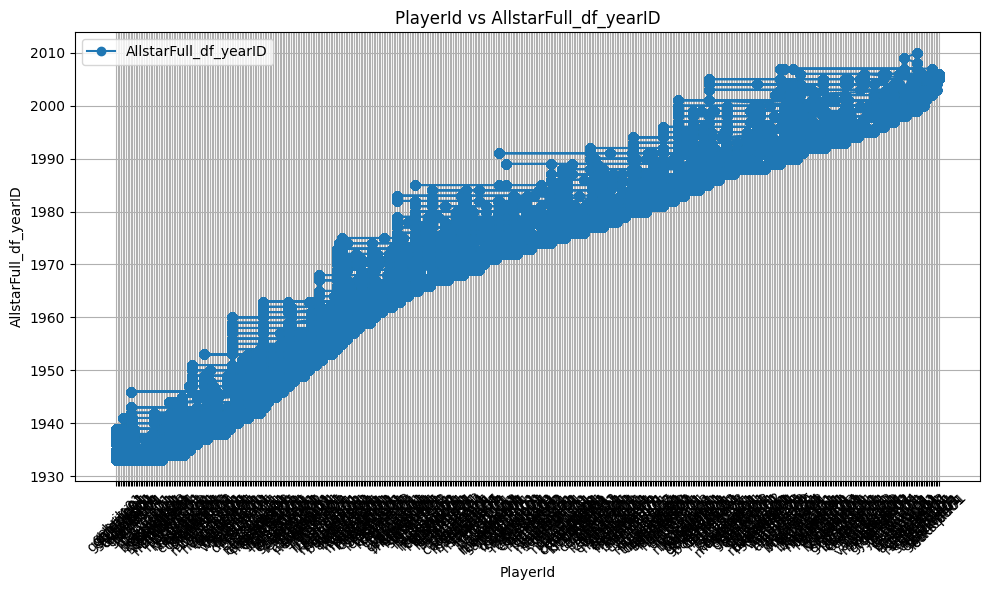

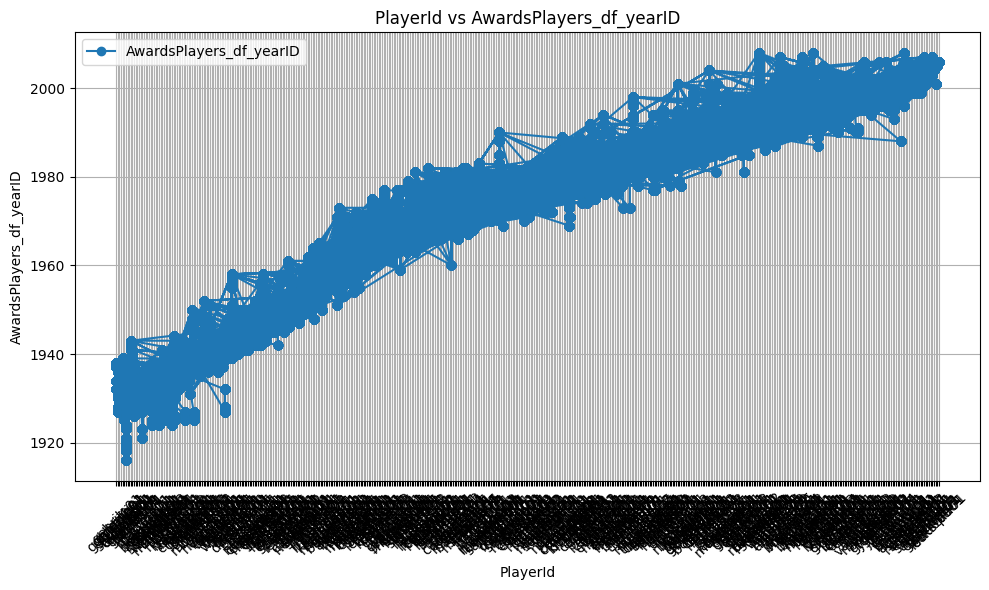

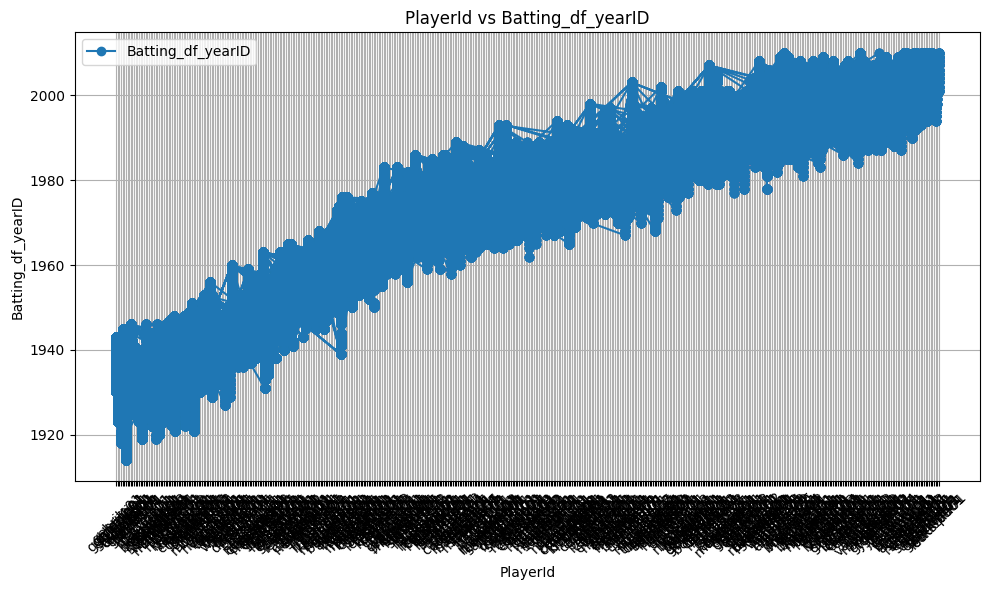

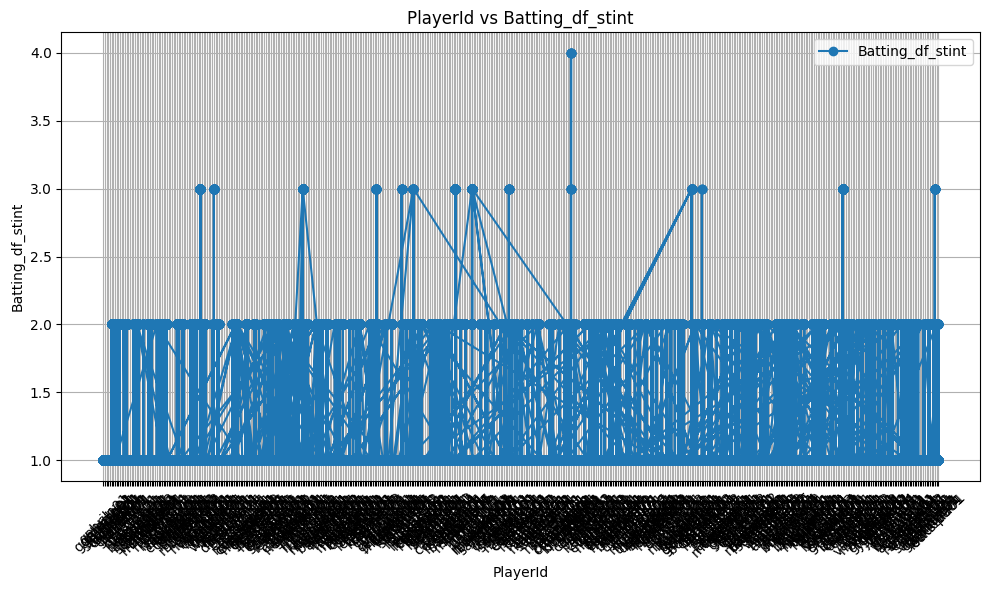

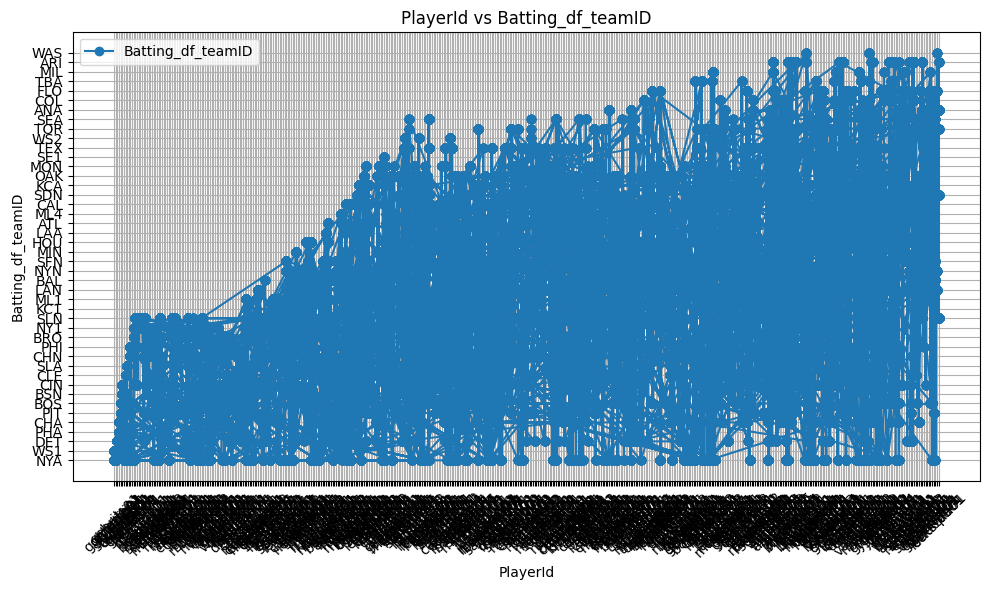

C:\Users\bshaske\AppData\Local\Temp\ipykernel_3572\1876214476.py:14: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\bshaske\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


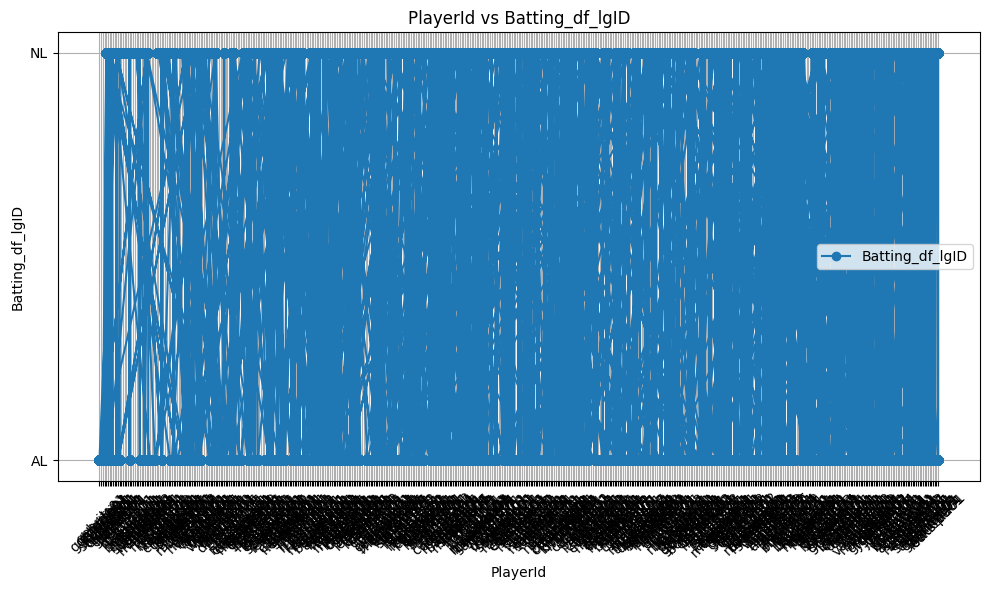

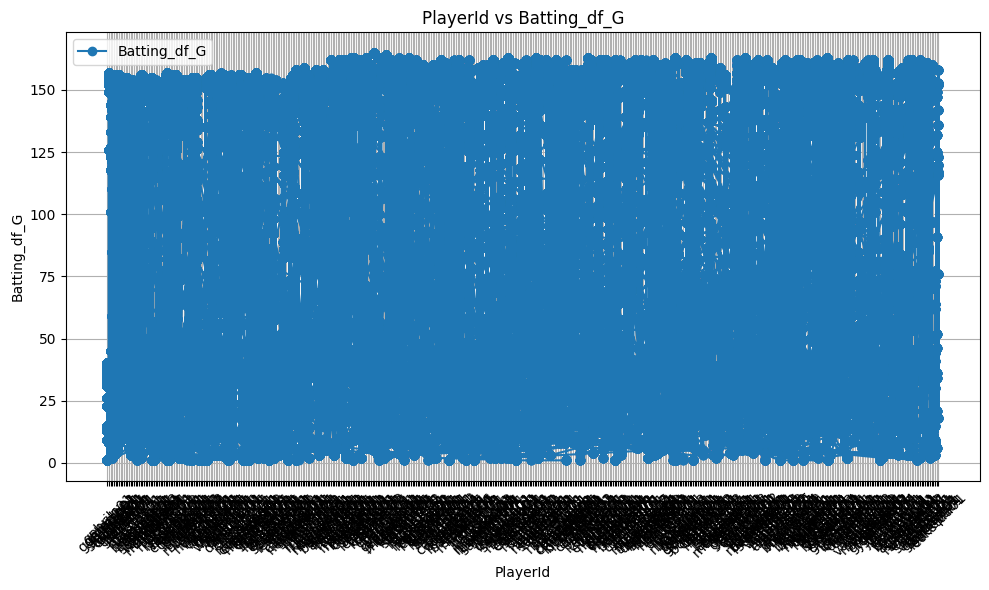

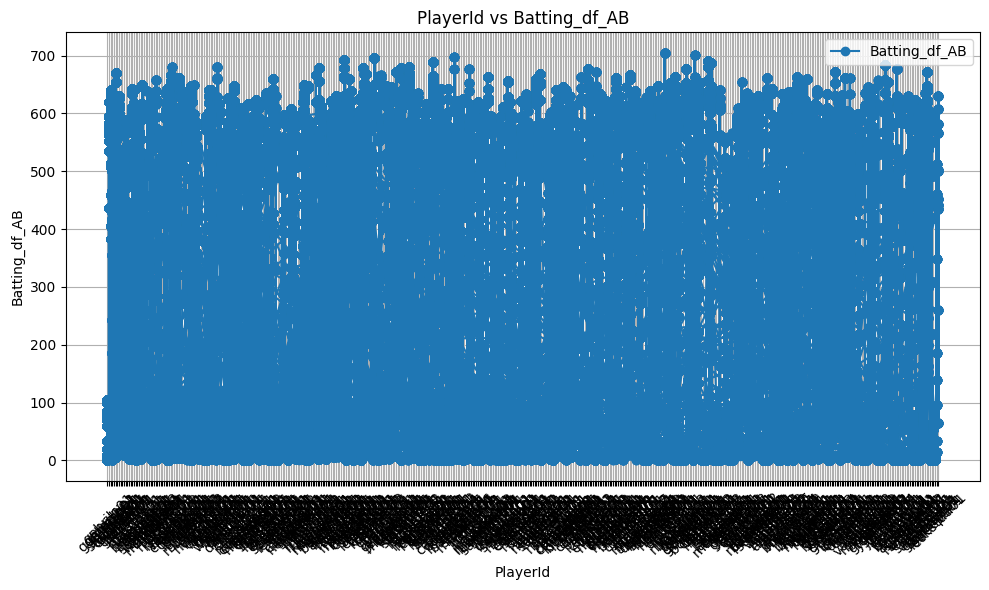

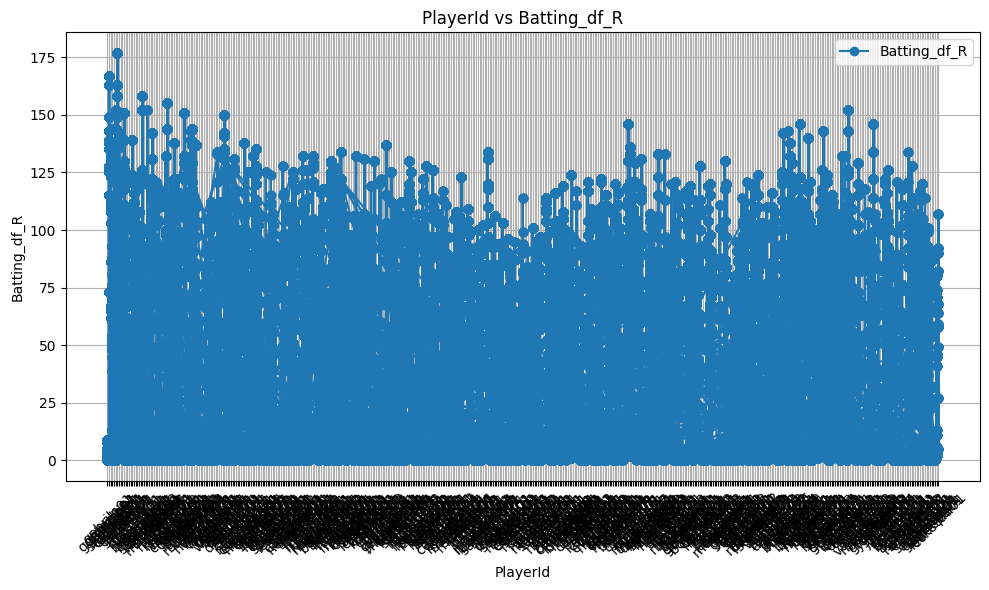

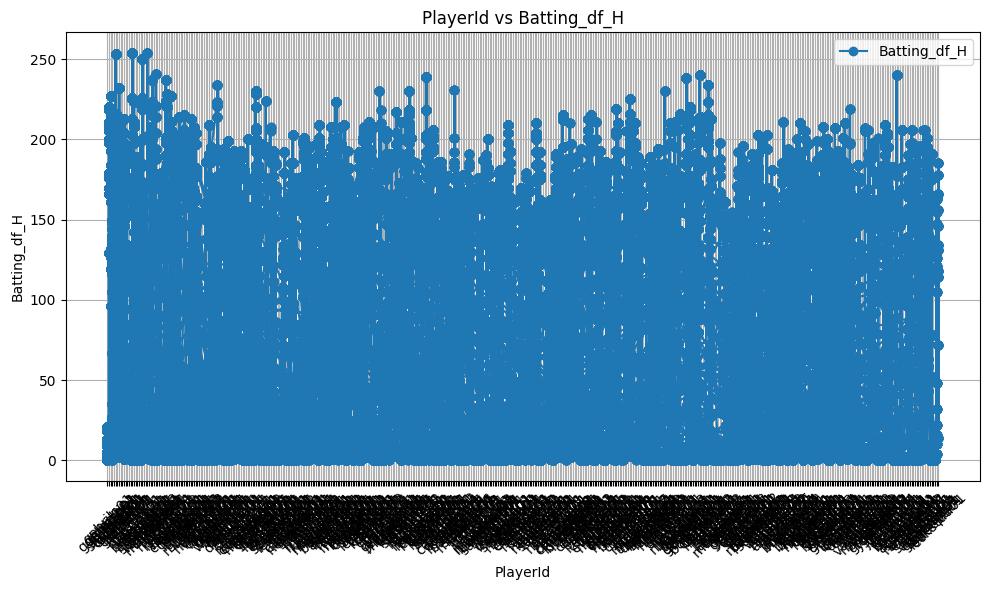

...

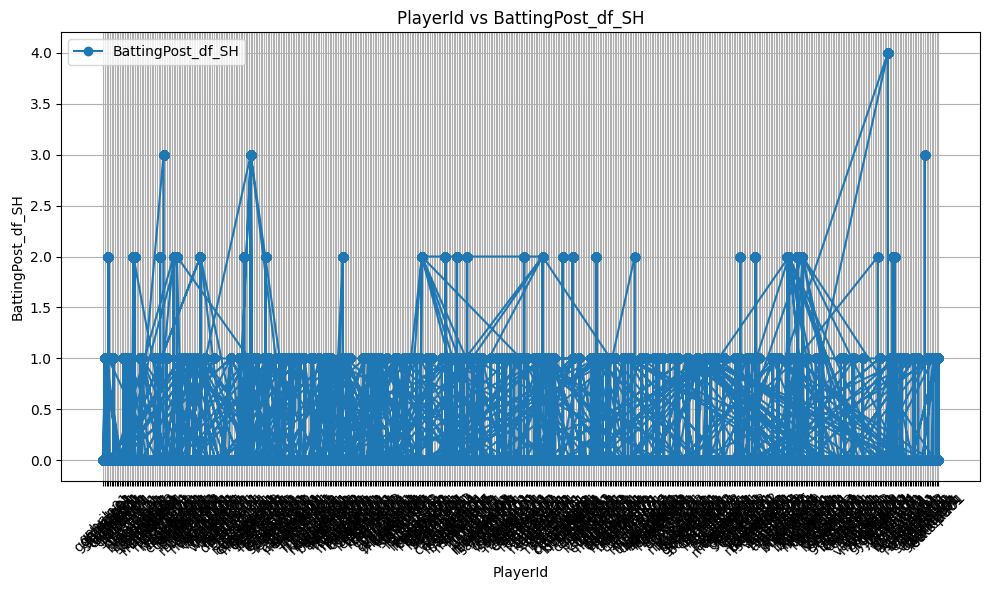

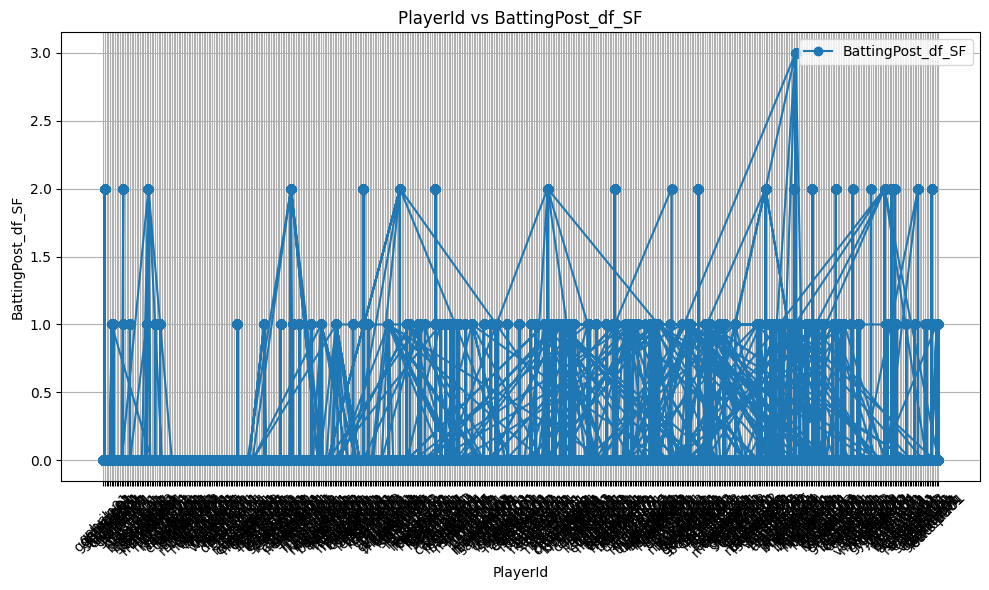

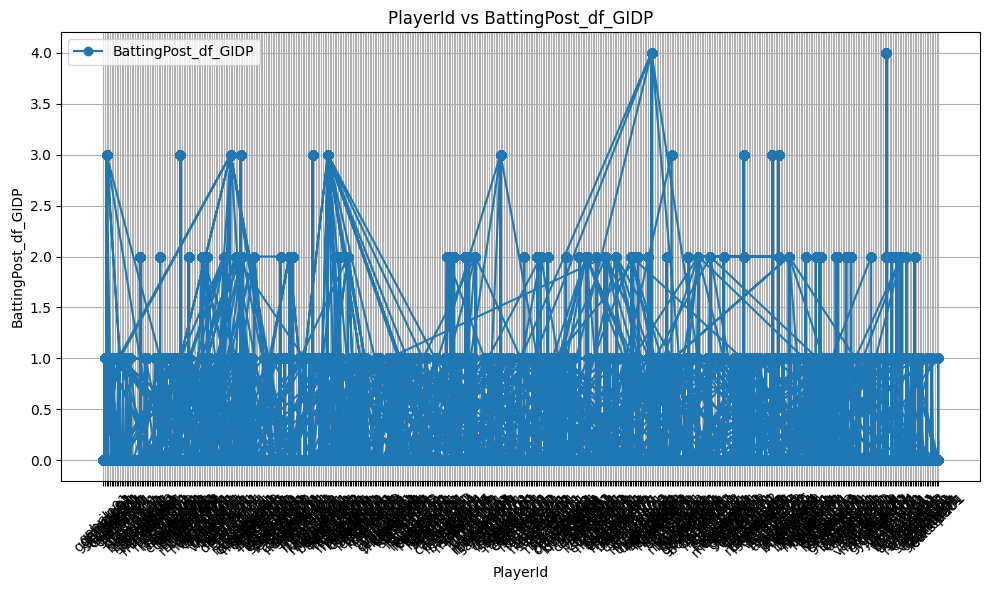

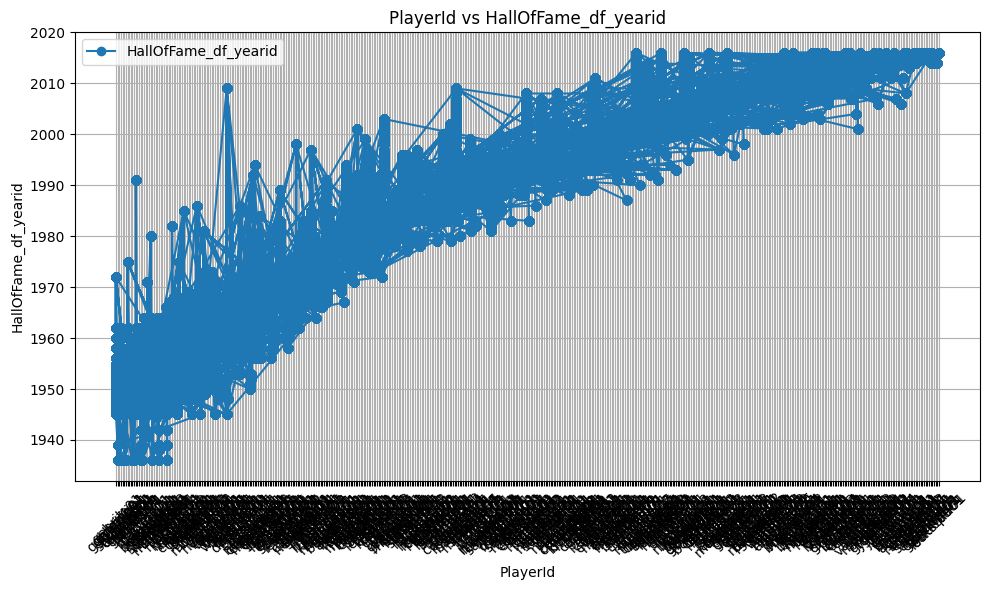

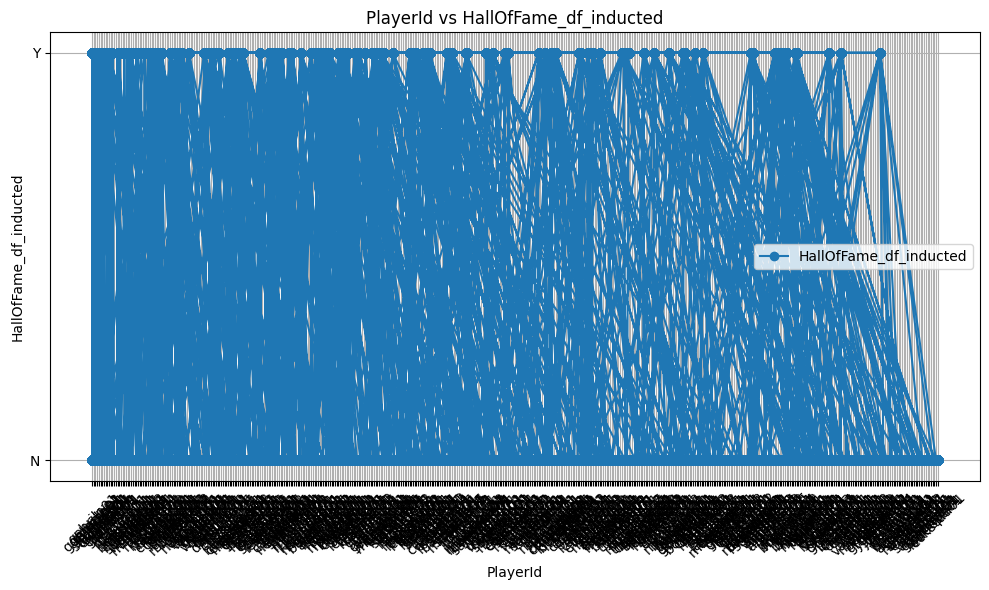

In [25]:
import matplotlib.pyplot as plt

# Plot each variable against PlayerId
for column in merged_df_2.columns:
    if column != 'playerID':  # Exclude PlayerId from y-axis variables
        plt.figure(figsize=(10, 6))
        plt.plot(merged_df_2['playerID'], merged_df_2[column], marker='o', linestyle='-', label=column)
        plt.xlabel('PlayerId')
        plt.ylabel(column)
        plt.title(f'PlayerId vs {column}')
        plt.grid(True)
        plt.legend()
        plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
        plt.tight_layout()
        plt.show()

In [26]:
# Calculate and print the maximum value for each column
for column in merged_df_2.columns:
    if merged_df_2[column].dtype != 'object':  # Skip non-numeric columns
        max_value = merged_df_2[column].max()
        print(f"The maximum value in column '{column}' is {max_value}")

The maximum value in column 'AllstarFull_df_yearID' is 2010
The maximum value in column 'AwardsPlayers_df_yearID' is 2008
The maximum value in column 'Batting_df_yearID' is 2010
The maximum value in column 'Batting_df_stint' is 4
The maximum value in column 'Batting_df_G' is 165
The maximum value in column 'Batting_df_AB' is 705.0
The maximum value in column 'Batting_df_R' is 177.0
The maximum value in column 'Batting_df_H' is 254.0
The maximum value in column 'Batting_df_2B' is 64.0
The maximum value in column 'Batting_df_3B' is 26.0
The maximum value in column 'Batting_df_HR' is 73.0
The maximum value in column 'Batting_df_RBI' is 184.0
The maximum value in column 'Batting_df_SB' is 130.0
The maximum value in column 'Batting_df_CS' is 42.0
The maximum value in column 'Batting_df_BB' is 232.0
The maximum value in column 'Batting_df_SO' is 189.0
The maximum value in column 'Batting_df_IBB' is 120.0
The maximum value in column 'Batting_df_HBP' is 35.0
The maximum value in column 'Battin

#Variable Type Declaration Converting Variable Types
 0   playerID                 object    Categorical
 1   AllstarFull_df_yearID    int16     Categorical
 2   AwardsPlayers_df_yearID  int16     Categorical
 3   Batting_df_yearID        int16     Categorical
 4   Batting_df_stint         int16     Numerical   int8
 5   Batting_df_teamID        object    Categorical
 6   Batting_df_lgID          object    Categorical
 7   Batting_df_G             int16     Numerical   int8
 8   Batting_df_AB            float16   Numerical   int16
 9   Batting_df_R             float16   Numerical   int8
 10  Batting_df_H             float16   Numerical   int16
 11  Batting_df_2B            float16   Numerical   int8
 12  Batting_df_3B            float16   ...
 13  Batting_df_HR            float16
 14  Batting_df_RBI           float16
 15  Batting_df_SB            float16
 16  Batting_df_CS            float16
 17  Batting_df_BB            float16
 18  Batting_df_SO            float16
 19  Batting_df_IBB           float16
 20  Batting_df_HBP           float16
 21  Batting_df_SH            float16
 22  Batting_df_SF            float16   ...
 23  Batting_df_GIDP          float16   Numerical int8
 24  BattingPost_df_yearID    int16     Categorical
 25  BattingPost_df_round     object    Categorical
 26  BattingPost_df_teamID    object    Categorical   
 27  BattingPost_df_lgID      object    Categorical 
 28  BattingPost_df_G         int16     Numerical int8
 29  BattingPost_df_AB        int16     ...
 30  BattingPost_df_R         int16  
 31  BattingPost_df_H         int16  
 32  BattingPost_df_2B        int16  
 33  BattingPost_df_3B        int16  
 34  BattingPost_df_HR        int16  
 35  BattingPost_df_RBI       int16  
 36  BattingPost_df_SB        int16  
 37  BattingPost_df_CS        float16
 38  BattingPost_df_BB        int16  
 39  BattingPost_df_SO        int16  
 40  BattingPost_df_IBB       float16
 41  BattingPost_df_HBP       float16
 42  BattingPost_df_SH        float16
 43  BattingPost_df_SF        float16   ...
 44  BattingPost_df_GIDP      float16   Numerical int8
 45  HallOfFame_df_yearid     int16     Categorical
 46  HallOfFame_df_inducted   object    Boolean

In [27]:
# List of columns to convert to int8
# Converted all NaN values in the following list of column to 0. Assuming that a NaN meant there were no respective stats for that player.
merge_2_int8_convert = ['Batting_df_stint', 'Batting_df_G', 'Batting_df_AB', 'Batting_df_R', 'Batting_df_H', 'Batting_df_2B', 'Batting_df_3B', 'Batting_df_HR',\
    'Batting_df_RBI', 'Batting_df_SB', 'Batting_df_CS', 'Batting_df_BB', 'Batting_df_SO', 'Batting_df_IBB', 'Batting_df_HBP', 'Batting_df_SH', 'Batting_df_SF',\
        'Batting_df_GIDP', 'BattingPost_df_G', 'BattingPost_df_AB', 'BattingPost_df_R', 'BattingPost_df_H', 'BattingPost_df_2B', 'BattingPost_df_3B',\
            'BattingPost_df_HR', 'BattingPost_df_RBI', 'BattingPost_df_SB', 'BattingPost_df_CS', 'BattingPost_df_BB', 'BattingPost_df_SO', 'BattingPost_df_IBB',\
                'BattingPost_df_HBP', 'BattingPost_df_SH', 'BattingPost_df_SF', 'BattingPost_df_GIDP']

# Replace NaN values with 0 and convert specified columns to int8
for column in merge_2_int8_convert:
    if column in merged_df_2.columns:
        merged_df_2[column] = merged_df_2[column].fillna(0).astype('int8')
        
# List of columns to convert to categorical
merge_2_cat_convert = ['playerID', 'AllstarFull_df_yearID', 'AwardsPlayers_df_yearID', 'Batting_df_yearID', 'Batting_df_teamID', 'Batting_df_lgID', 'BattingPost_df_yearID',\
    'BattingPost_df_round', 'BattingPost_df_teamID', 'BattingPost_df_lgID', 'HallOfFame_df_yearid']

# Check for null values and print if found
for column in merge_2_cat_convert:
    if column in merged_df_2.columns:
        print(merged_df_2[column].unique())
        if merged_df_2[column].isnull().any():
            print(f"Null values found in column '{column}'")
        # Convert to categorical
        merged_df_2[column] = merged_df_2[column].astype('category')
        
merged_df_2['HallOfFame_df_inducted'] = merged_df_2['HallOfFame_df_inducted'].astype('bool')
        
#Print to double check the conversion
print(merged_df_2.info())

['gomezle01' 'gehrilo01' 'gehrich01' 'dykesji01' 'cronijo01' 'simmoal01'
 'ruthba01' 'averiea01' 'crowdal01' 'dickebi01' 'foxxji01' 'grovele01'
 'lazzeto01' 'hallabi01' 'wilsoji01' 'terrybi01' 'friscfr01' 'martipe01'
 'bartedi01' 'hafeych01' 'bergewa01' 'kleinch01' 'hartnga01' 'hubbeca01'
 'odoulle01' 'schumha02' 'traynpi01' 'wanerpa01' 'warnelo01' 'manushe01'
 'bridgto01' 'cochrmi01' 'higgipi01' 'ruffire01' 'jackstr01' 'medwijo01'
 'cuyleki01' 'deandi01' 'hermabi01' 'moorejo02' 'ottme01' 'vaughar01'
 'bluegos01' 'cramedo01' 'rowesc01' 'derripa01' 'dimagjo01' 'gosligo01'
 'daviscu01' 'lombaer01' 'rolfere01' 'greenha01' 'moseswa01' 'mizejo01'
 'jurgebi01' 'waltebu01' 'allenjo02' 'fellebo01' 'newsobo01' 'yorkru01'
 'vandejo01' 'mccorfr01' 'hackst01' 'danniha01' 'lavagco01' 'turneji01'
 'wanerll01' 'gordojo01' 'camildo01' 'wyattwh01' 'willite01' 'kellech01'
 'boudrlo01' 'keltnke01' 'nichobi01' 'doerrbo01' 'dimagdo01' 'tebbebi01'
 'reisepe01' 'elliobo01' 'slaugen01' 'chandsp01' 'henrito01'

#Saving cleaned data to .csv files.

In [28]:
#merged_df_1.to_csv('Batting_HoF', index=False)
merged_df_2.to_csv('Awards_Batting_HoF.csv', index=False)

# Define the path to the project space
path = os.getcwd()  # Get the current working directory

#Verify the saved file and conversion to dataframe
Awards_Batting_HoF_df = pd.read_csv(os.path.join(path, 'Awards_Batting_HoF.csv'))
Awards_Batting_HoF_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10139631 entries, 0 to 10139630
Data columns (total 47 columns):
 #   Column                   Dtype 
---  ------                   ----- 
 0   playerID                 object
 1   AllstarFull_df_yearID    int64 
 2   AwardsPlayers_df_yearID  int64 
 3   Batting_df_yearID        int64 
 4   Batting_df_stint         int64 
 5   Batting_df_teamID        object
 6   Batting_df_lgID          object
 7   Batting_df_G             int64 
 8   Batting_df_AB            int64 
 9   Batting_df_R             int64 
 10  Batting_df_H             int64 
 11  Batting_df_2B            int64 
 12  Batting_df_3B            int64 
 13  Batting_df_HR            int64 
 14  Batting_df_RBI           int64 
 15  Batting_df_SB            int64 
 16  Batting_df_CS            int64 
 17  Batting_df_BB            int64 
 18  Batting_df_SO            int64 
 19  Batting_df_IBB           int64 
 20  Batting_df_HBP           int64 
 21  Batting_df_SH            int6